# **Business Case**

_To Create a predictive model for **studying the future trends of vaccine** for any particular diseases and to prepare a **complete data analysis report** on the given data._

# **Importing Libraries and dataset**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
pip install --upgrade scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 27.0 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2


In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from warnings import filterwarnings
filterwarnings('ignore')

In [4]:
dataset1 = pd.read_csv('/content/drive/MyDrive/labels.csv')
dataset2 = pd.read_csv('/content/drive/MyDrive/features.csv')

In [5]:
combined_data = pd.concat([dataset1,dataset2],axis=1)
combined_data

,respondent_id,h1n1_vaccine,seasonal_vaccine,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,...,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,...,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,0,1,1,3.0,2.0,0.0,1.0,0.0,1.0,...,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,0,0,2,1.0,1.0,0.0,1.0,0.0,0.0,...,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,0,1,3,1.0,1.0,0.0,1.0,0.0,1.0,...,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,0,0,4,2.0,1.0,0.0,1.0,0.0,1.0,...,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,0,0,26702,2.0,0.0,0.0,1.0,0.0,0.0,...,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN
26703,26703,0,0,26703,1.0,2.0,0.0,1.0,0.0,1.0,...,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea
26704,26704,0,1,26704,2.0,2.0,0.0,1.0,1.0,1.0,...,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN
26705,26705,0,0,26705,1.0,1.0,0.0,0.0,0.0,0.0,...,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg


In [6]:
data = combined_data.loc[:, ~combined_data.columns.duplicated()]
data

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,...,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,...,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,...,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,...,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,...,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,0,0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,...,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN
26703,26703,0,0,1.0,2.0,0.0,1.0,0.0,1.0,0.0,...,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea
26704,26704,0,1,2.0,2.0,0.0,1.0,1.0,1.0,1.0,...,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN
26705,26705,0,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg


In [7]:
pd.set_option('display.max_columns',None)
data

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,0,0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,1.0,5.0,2.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN
26703,26703,0,0,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea
26704,26704,0,1,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,4.0,2.0,5.0,4.0,2.0,55 - 64 Years,Some College,White,Female,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN
26705,26705,0,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg


**INSIGHTS**

*   _We first **install Scikit-learn**. Scikit-learn provides a simple and consistent interface for various machine learning tasks which makes it easy to use._

*   _Once done with installing Scikit,  we did was importing the **essential libraries** which are needed inorder to work with the dataset._

*   _Once imported the basic libraries, we then **concatenated the labels and features column into a single column** and named it **combined_data**._

*   _Then we dropped the duplicated column in the combined_data and further named it as data._

*   _We used a pandas function **pd.set_option** to **display all the columns** in order to get an overview of this dataset._

# **Domain Analysis:**

*   _Vaccines provide **immunization for individuals** and a well-immunized community can further reduce the spread of diseases through **"herd immunity"**._

*   _In this dataset, we will look at vaccination, a vital public health measure that is used to **fight infectious diseases.**_

*   _Beginning in spring 2009, a pandemic caused by the H1N1 influenza virus, colloquially named **"swine flu,"** swept across the world.._

*   _A **vaccine for the H1N1 flu virus** became publicly available in October 2009._

*   _The goal is to predict how likely individuals are to receive their **H1N1 and seasonal flu vaccines.**_

*   _Specifically, we will be **creating a predictive model** for studying the future trends of vaccine for any particular diseases._

# **Basic Checks**

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26707 entries, 0 to 26706
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   respondent_id                26707 non-null  int64  
 1   h1n1_vaccine                 26707 non-null  int64  
 2   seasonal_vaccine             26707 non-null  int64  
 3   h1n1_concern                 26615 non-null  float64
 4   h1n1_knowledge               26591 non-null  float64
 5   behavioral_antiviral_meds    26636 non-null  float64
 6   behavioral_avoidance         26499 non-null  float64
 7   behavioral_face_mask         26688 non-null  float64
 8   behavioral_wash_hands        26665 non-null  float64
 9   behavioral_large_gatherings  26620 non-null  float64
 10  behavioral_outside_home      26625 non-null  float64
 11  behavioral_touch_face        26579 non-null  float64
 12  doctor_recc_h1n1             24547 non-null  float64
 13  doctor_recc_seas

In [9]:
data.shape

(26707, 38)

In [10]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
respondent_id,26707.0,13353.000000,7709.791156,0.0,6676.5,13353.0,20029.5,26706.0
h1n1_vaccine,26707.0,0.212454,0.409052,0.0,0.0,0.0,0.0,1.0
seasonal_vaccine,26707.0,0.465608,0.498825,0.0,0.0,0.0,1.0,1.0
h1n1_concern,26615.0,1.618486,0.910311,0.0,1.0,2.0,2.0,3.0
h1n1_knowledge,26591.0,1.262532,0.618149,0.0,1.0,1.0,2.0,2.0
behavioral_antiviral_meds,26636.0,0.048844,0.215545,0.0,0.0,0.0,0.0,1.0
behavioral_avoidance,26499.0,0.725612,0.446214,0.0,0.0,1.0,1.0,1.0
behavioral_face_mask,26688.0,0.068982,0.253429,0.0,0.0,0.0,0.0,1.0
behavioral_wash_hands,26665.0,0.825614,0.379448,0.0,1.0,1.0,1.0,1.0
behavioral_large_gatherings,26620.0,0.358640,0.479610,0.0,0.0,0.0,1.0,1.0


In [11]:
data.drop_duplicates()

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,0,0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,1.0,5.0,2.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN
26703,26703,0,0,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea
26704,26704,0,1,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,4.0,2.0,5.0,4.0,2.0,55 - 64 Years,Some College,White,Female,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN
26705,26705,0,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg


In [12]:
data.isnull().sum()

respondent_id                      0
h1n1_vaccine                       0
seasonal_vaccine                   0
h1n1_concern                      92
h1n1_knowledge                   116
behavioral_antiviral_meds         71
behavioral_avoidance             208
behavioral_face_mask              19
behavioral_wash_hands             42
behavioral_large_gatherings       87
behavioral_outside_home           82
behavioral_touch_face            128
doctor_recc_h1n1                2160
doctor_recc_seasonal            2160
chronic_med_condition            971
child_under_6_months             820
health_worker                    804
health_insurance               12274
opinion_h1n1_vacc_effective      391
opinion_h1n1_risk                388
opinion_h1n1_sick_from_vacc      395
opinion_seas_vacc_effective      462
opinion_seas_risk                514
opinion_seas_sick_from_vacc      537
age_group                          0
education                       1407
race                               0
s

In [13]:
data.dtypes

respondent_id                    int64
h1n1_vaccine                     int64
seasonal_vaccine                 int64
h1n1_concern                   float64
h1n1_knowledge                 float64
behavioral_antiviral_meds      float64
behavioral_avoidance           float64
behavioral_face_mask           float64
behavioral_wash_hands          float64
behavioral_large_gatherings    float64
behavioral_outside_home        float64
behavioral_touch_face          float64
doctor_recc_h1n1               float64
doctor_recc_seasonal           float64
chronic_med_condition          float64
child_under_6_months           float64
health_worker                  float64
health_insurance               float64
opinion_h1n1_vacc_effective    float64
opinion_h1n1_risk              float64
opinion_h1n1_sick_from_vacc    float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_vacc    float64
age_group                       object
education                

**INSIGHTS**

*   _We can get a basic idea of the dataset by checking its data types (**dtypes**) and dimensions **(shape)**. This helps us understand what kind of data we're working with and how it's organized._.

*   _Using **describe().T** function we can compute summary **statistics** for the **numerical columns** in the data_.

*   _Finally we **drop the duplicates** which are in the dataset and we identify the **missing values (NaN or None)** using **isnull()** function.  which identifies null values in the Dataset_

# **Exploratory Data Analysis-EDA**

*   _Univariate analysis_
*   _Bi-variate analysis_
*   _Multivariate analysis_

## **Univariate analysis**

In [ ]:
!pip install ydata_profiling[notebook]

In [ ]:
import ydata_profiling as yp

profile = yp.ProfileReport(data)
profile.to_html()
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**INSIGHTS**

*   _**Univariate analysis** is a statistical method used to analyze data that involves only one variable. It is a fundamental technique in exploratory data analysis (EDA) and is often the first step in understanding the characteristics and distribution of individual variables._

*   _We used **Pandas Profiling** to arrive the Univariate report._

## **Bi-variate analysis**

In [14]:
categorical_columns = [col for col,
                      dtype in data.dtypes.items()
                       if str(dtype) in ('object', 'categorical')]
categorical_columns

['age_group',
 'education',
 'race',
 'sex',
 'income_poverty',
 'marital_status',
 'rent_or_own',
 'employment_status',
 'hhs_geo_region',
 'census_msa',
 'employment_industry',
 'employment_occupation']

In [15]:
numerical_columns = [col for col,
                     dtype in data.dtypes.items()
                     if np.issubdtype (dtype,np.number)]
numerical_columns

['respondent_id',
 'h1n1_vaccine',
 'seasonal_vaccine',
 'h1n1_concern',
 'h1n1_knowledge',
 'behavioral_antiviral_meds',
 'behavioral_avoidance',
 'behavioral_face_mask',
 'behavioral_wash_hands',
 'behavioral_large_gatherings',
 'behavioral_outside_home',
 'behavioral_touch_face',
 'doctor_recc_h1n1',
 'doctor_recc_seasonal',
 'chronic_med_condition',
 'child_under_6_months',
 'health_worker',
 'health_insurance',
 'opinion_h1n1_vacc_effective',
 'opinion_h1n1_risk',
 'opinion_h1n1_sick_from_vacc',
 'opinion_seas_vacc_effective',
 'opinion_seas_risk',
 'opinion_seas_sick_from_vacc',
 'household_adults',
 'household_children']

In [16]:
# categorical columns
data1 = data[['age_group','education','race','sex','income_poverty','marital_status','rent_or_own',
              'employment_status','hhs_geo_region','census_msa','employment_industry','employment_occupation']]

# Numerical columns
data2 = data[['respondent_id','h1n1_vaccine','seasonal_vaccine','h1n1_concern','h1n1_knowledge','behavioral_antiviral_meds',
              'behavioral_avoidance','behavioral_face_mask','behavioral_wash_hands','behavioral_large_gatherings',
              'behavioral_outside_home','behavioral_touch_face','doctor_recc_h1n1','doctor_recc_seasonal','chronic_med_condition',
              'child_under_6_months','health_worker','health_insurance','opinion_h1n1_vacc_effective','opinion_h1n1_risk',
              'opinion_h1n1_sick_from_vacc','opinion_seas_vacc_effective','opinion_seas_risk','opinion_seas_sick_from_vacc',
              'household_adults','household_children']]

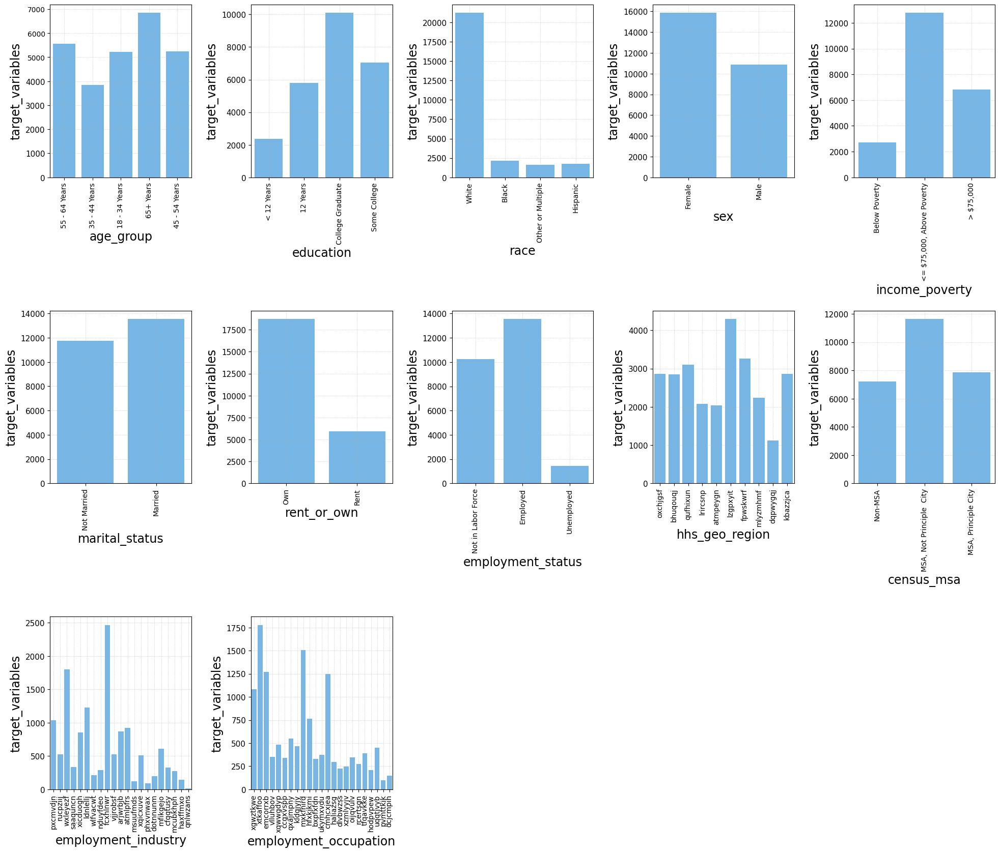

In [17]:
plt.figure(figsize=(20, 22), facecolor='white')
plotnumber = 1

target_variables = ['h1n1_vaccine', 'seasonal_vaccine']

for column in data1.columns:
    if plotnumber <= 20 and column not in target_variables:
        ax = plt.subplot(4, 5, plotnumber)
        ax = plt.gca()
        for line in ax.lines:
            line.set_linewidth(0.6)
        sns.countplot(x=data1[column], color="#65B8F7", linewidth=0.5)
        plt.xlabel(column, fontsize=17, ha='center')
        plt.ylabel('target_variables', fontsize=17)
        plt.subplots_adjust(left=0.3, right=0.7, bottom=0.3, top=0.7, wspace=0.3, hspace=0.5)
        plt.xticks(rotation=90, ha='center', fontsize=10)
        plt.yticks(fontsize=11)
        plt.grid(True, linestyle=':', linewidth=0.5)
        plotnumber += 1

plt.tight_layout(pad=2)
plt.show()

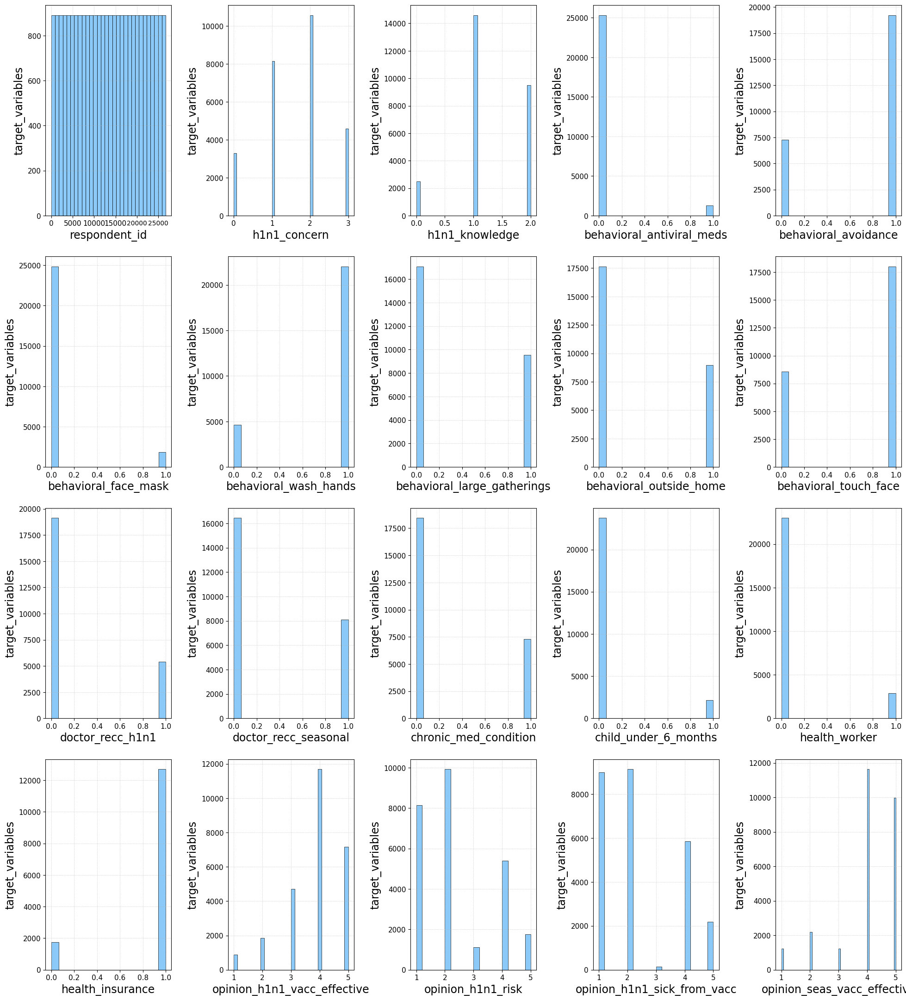

In [ ]:
plt.figure(figsize=(20, 22), facecolor='white')
plotnumber = 1

target_variables = ['h1n1_vaccine', 'seasonal_vaccine']

for column in data2.columns:
    if plotnumber <= 20 and column not in target_variables:
        ax = plt.subplot(4, 5, plotnumber)
        ax = plt.gca()
        for line in ax.lines:
            line.set_linewidth(0.6)
        sns.histplot(x=data2[column], color="#65B8F7", linewidth=0.5)
        plt.xlabel(column, fontsize=17, ha='center')
        plt.ylabel('target_variables', fontsize=17)
        plt.subplots_adjust(left=0.3, right=0.7, bottom=0.3, top=0.7, wspace=0.3, hspace=0.5)
        plt.xticks(rotation=0, ha='center', fontsize=11)
        plt.yticks(fontsize=11)
        plt.grid(True, linestyle=':', linewidth=0.5)
        plotnumber += 1

plt.tight_layout(pad=2)
plt.show()

**INSIGHTS**

*   _**Bivariate analysis** examines relationships between two variables **categorical and numerical** using visualizations with **Matplotlib** and **Seaborn** and denoted as **data1** and **data2**_

*   _These visualizations, colored by a variable **hue** which reveals trends, patterns, and potential connections between the data._

*   _To effectively visualize our data, we used **countplot** for **categorical** columns and **histplot** for numerical columns which provides a clear distinction between the data types_.

## **Multi-variate Analysis**

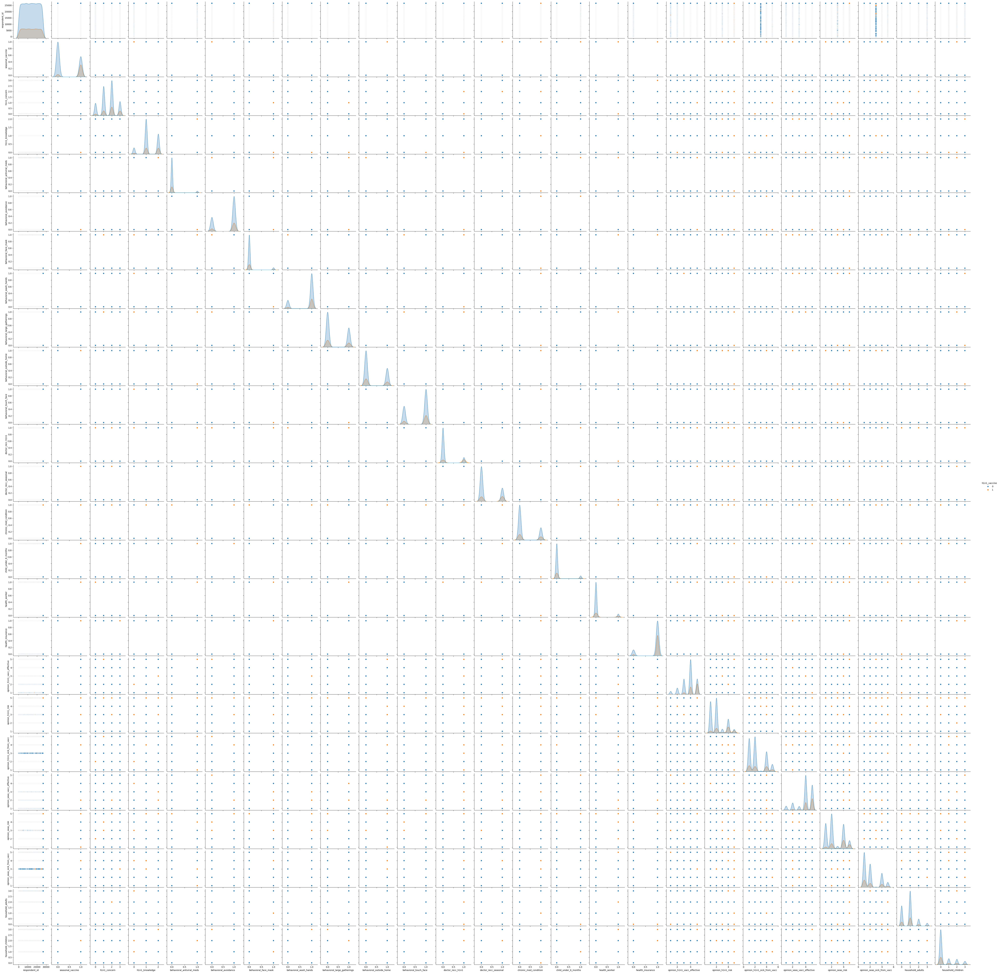

In [18]:
sns.pairplot(data=data2, hue='h1n1_vaccine')
plt.show()

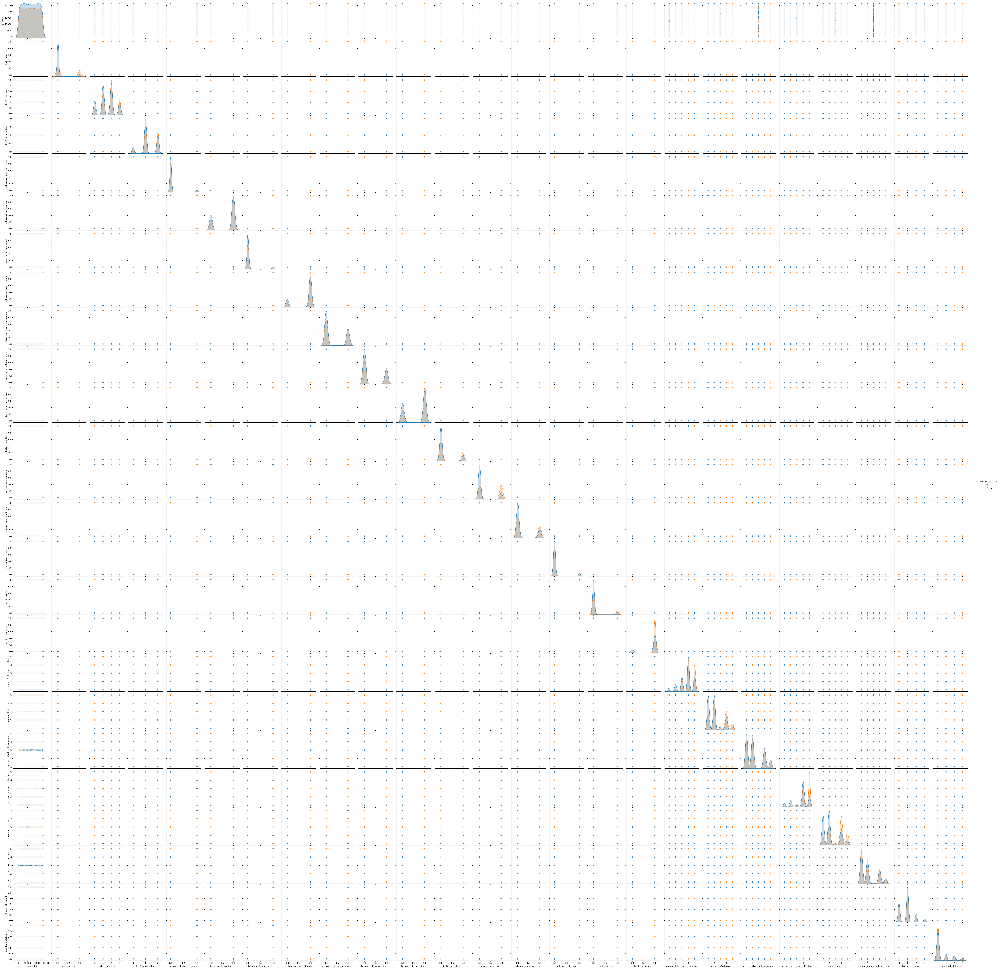

In [19]:
sns.pairplot(data2, hue='seasonal_vaccine')
plt.show()

**INSIGHTS**

*   _**Multivariate analysis** is a statistical method used to analyze data that involves multiple variables simultaneously._

*   _We used **pairplot separately for h1n1 vaccine and seasonal vaccine* to arrive at the multivariate report._

# **Data Preprocessing:**

*   _Handling Missing values_

*   _Encoding_

*   _Handling Outliers_

*   _Feature Scaling_

*   _Data Splitting_

*   _Scaling_

*   _Balancing the data_

## **Handling Missing Values**

In [ ]:
data.isnull().sum()

respondent_id                      0
h1n1_vaccine                       0
seasonal_vaccine                   0
h1n1_concern                      92
h1n1_knowledge                   116
behavioral_antiviral_meds         71
behavioral_avoidance             208
behavioral_face_mask              19
behavioral_wash_hands             42
behavioral_large_gatherings       87
behavioral_outside_home           82
behavioral_touch_face            128
doctor_recc_h1n1                2160
doctor_recc_seasonal            2160
chronic_med_condition            971
child_under_6_months             820
health_worker                    804
health_insurance               12274
opinion_h1n1_vacc_effective      391
opinion_h1n1_risk                388
opinion_h1n1_sick_from_vacc      395
opinion_seas_vacc_effective      462
opinion_seas_risk                514
opinion_seas_sick_from_vacc      537
age_group                          0
education                       1407
race                               0
s

In [ ]:
null_cols = data.columns[data.isnull().any()]
print('Column with Missing Values',null_cols)

Column with Missing Values Index(['h1n1_concern', 'h1n1_knowledge', 'behavioral_antiviral_meds',
       'behavioral_avoidance', 'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face', 'doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'education',
       'income_poverty', 'marital_status', 'rent_or_own', 'employment_status',
       'household_adults', 'household_children', 'employment_industry',
       'employment_occupation'],
      dtype='object')


In [ ]:
total_cells = np.product(data.shape)
total_missing = data.isnull().sum().sum()
percentage_missing = (total_missing/total_cells)*100
print('Percentage of overall missing data:',percentage_missing,'%')

Percentage of overall missing data: 5.987194368517617 %


In [ ]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='median')
for col in null_cols:
  if pd.api.types.is_numeric_dtype(data[col]):
    data[col]=imputer.fit_transform(data[[col]])[:,0]
  if not pd.api.types.is_numeric_dtype(data[col]):
    data[col].fillna(data[col].mode(dropna=True).iloc[0],inplace=True)
  if data[col].isnull().sum() /len(data)>0.5:
    data.drop(col,axis=1,inplace=True)

In [ ]:
total_cells = np.product(data.shape)
total_missing = data.isnull().sum().sum()
percentage_missing = (total_missing/total_cells)*100
print('Percentage of overall missing data:',percentage_missing,'%')

Percentage of overall missing data: 0.0 %


**INSIGHTS**

*   _**Missing values** can significantly impact the data.  They can lead to **biased results, inaccurate models**, and reduced efficiency of algorithms._

*   _We utilized the **data.columns[data.isnull().any()]** function to detect any **null values** which are in the dataset and calculated the percentage of missing data across the dataset_.

*  _The dataset contained incomplete data **(missing values)**. To address this, we employed the **Simple Imputer** function_.

*  _This technique **fills** the **missing values**, mitigating potential bias in the results, **enhancing model accuracy**, and making the data compatible with a broader selection of algorithms._


## **Encoding**

In [ ]:
float_columns = data.select_dtypes(include='float64').columns

In [ ]:
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()
for col in categorical_columns:
  data[col] = LE.fit_transform(data[col])

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26707 entries, 0 to 26706
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   respondent_id                26707 non-null  int64  
 1   h1n1_vaccine                 26707 non-null  int64  
 2   seasonal_vaccine             26707 non-null  int64  
 3   h1n1_concern                 26707 non-null  float64
 4   h1n1_knowledge               26707 non-null  float64
 5   behavioral_antiviral_meds    26707 non-null  float64
 6   behavioral_avoidance         26707 non-null  float64
 7   behavioral_face_mask         26707 non-null  float64
 8   behavioral_wash_hands        26707 non-null  float64
 9   behavioral_large_gatherings  26707 non-null  float64
 10  behavioral_outside_home      26707 non-null  float64
 11  behavioral_touch_face        26707 non-null  float64
 12  doctor_recc_h1n1             26707 non-null  float64
 13  doctor_recc_seas

**INSIGHTS**

*   _By converting text and categories into a numerical language, **Encoding** unlocks the ability of **machine learning models** to **decrypt** connections between features and thereby leading to sharper predictions._

*   _We applied the **Label Encoder** technique for encoding. Utilizing label encoding within a **For Loop function**, we iterated through both the categorical and float columns, **converting** them to **int64**_.



## **Handling Outliers**

In [ ]:
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3-Q1
LB = 1 - 1.5*IQR
UB = 3 + 1.5*IQR
outliers_count = ((data<LB)|(data>UB)).sum()
outleirs_percentage = (outliers_count/len(data))*100
print('\n sum of outluiers percentage:\n',outleirs_percentage)


 sum of outluiers percentage:
 respondent_id                  24.989703
h1n1_vaccine                   78.754634
seasonal_vaccine                0.000000
h1n1_concern                    0.000000
h1n1_knowledge                  0.000000
behavioral_antiviral_meds      95.128618
behavioral_avoidance            0.000000
behavioral_face_mask           93.106676
behavioral_wash_hands          17.411166
behavioral_large_gatherings     0.000000
behavioral_outside_home         0.000000
behavioral_touch_face           0.000000
doctor_recc_h1n1               79.750627
doctor_recc_seasonal            0.000000
chronic_med_condition           0.000000
child_under_6_months           91.994608
health_worker                  89.145168
health_insurance                6.500168
opinion_h1n1_vacc_effective     0.000000
opinion_h1n1_risk               0.000000
opinion_h1n1_sick_from_vacc     0.000000
opinion_seas_vacc_effective    37.342270
opinion_seas_risk               0.000000
opinion_seas_sick_from_va

In [ ]:
for column_name,  percentage in outleirs_percentage.items():
  if percentage < 5:
    print(f'{column_name}:{percentage}')

seasonal_vaccine:0.0
h1n1_concern:0.0
h1n1_knowledge:0.0
behavioral_avoidance:0.0
behavioral_large_gatherings:0.0
behavioral_outside_home:0.0
behavioral_touch_face:0.0
doctor_recc_seasonal:0.0
chronic_med_condition:0.0
opinion_h1n1_vacc_effective:0.0
opinion_h1n1_risk:0.0
opinion_h1n1_sick_from_vacc:0.0
opinion_seas_risk:0.0
age_group:0.0
education:0.0
sex:0.0
income_poverty:0.0
marital_status:0.0
employment_status:0.0
hhs_geo_region:0.0
census_msa:0.0
household_adults:0.0
household_children:0.0


In [ ]:
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline

Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3-Q1
LB = 1 - 1.5*IQR
UB = 3 + 1.5*IQR
outliers_count = ((data<LB)|(data>UB)).sum()
total_counts = data.count()
outliers_percentage = (outliers_count / total_counts) * 100
columns_to_keep = outleirs_percentage[outleirs_percentage<5].index
data_filtered = data[columns_to_keep]

RS = RobustScaler()
refined_data = RS.fit_transform(data_filtered)

In [ ]:
refined_data

array([[ 0. , -1. , -1. , ...,  0.5, -1. ,  0. ],
       [ 1. ,  1. ,  1. , ..., -0.5, -1. ,  0. ],
       [ 0. , -1. ,  0. , ..., -0.5,  1. ,  0. ],
       ...,
       [ 1. ,  0. ,  1. , ..., -0.5, -1. ,  0. ],
       [ 0. , -1. ,  0. , ...,  0.5,  0. ,  0. ],
       [ 0. , -2. , -1. , ...,  0. ,  0. ,  0. ]])

**INSIGHTS**

*   _Outliers act as **red flags** and it can reveal **unexpected patters** or **errors** in the data that can **impact** how we analyze data and make decisions._

*   _To manage **outliers**, we utilized a **pipeline** combining **IQR** outlier detection and **Robust Scaling** for data normalization._

*   _Robust Scaler helps to maintain **data integrity**, improve **model training**, and ultimately lead to more reliable results._

*   _It helps us to pinpoint these outliers in the data, ultimately leading to more **accurate analyses** and **prevent misleading results**._

## **Feature Selection**

<Axes: >

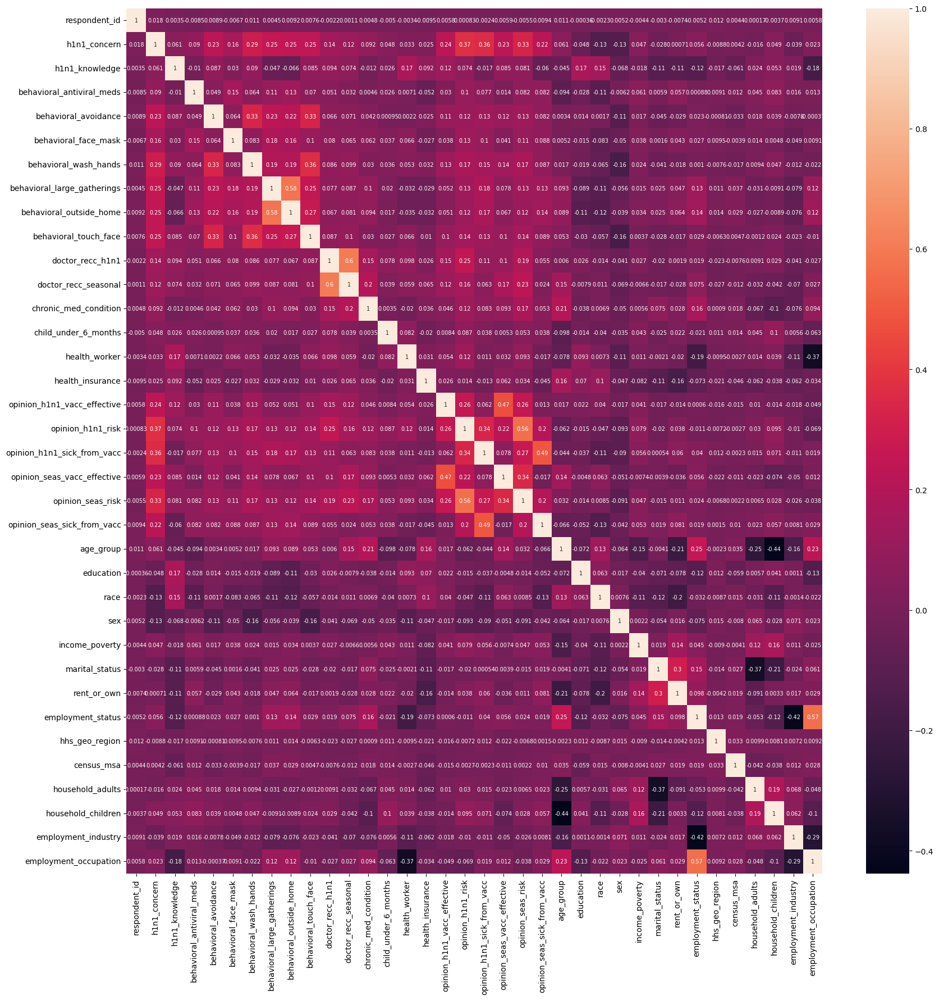

In [ ]:
plt.figure(figsize=(20,20),facecolor='white')
sns.heatmap(data.drop(columns=['seasonal_vaccine','h1n1_vaccine']).corr(),annot=True, annot_kws={'size':7})

**INSIGHTS**

*   _With the Help of **Feature selection** we can eliminate **irrelevant or redundant features**_.

*   _The model will focus on the information that **truly** matters for **prediction**. This can lead to more accurate and **generalizable models**, avoiding issues like **overfitting**_.

*   _To see how our features are interrelated, we used Seaborn's **heatmap** function. This will create a visual representation of **correlations** between the features in our data_.

## **Data Splitting**

In [ ]:
x = data.drop(columns=['seasonal_vaccine','h1n1_vaccine'],axis=1)
y = data[['seasonal_vaccine','h1n1_vaccine']]

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.20,random_state=43)

In [ ]:
x_train

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
711,711,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,1.0,1.0,1.0,2,2,3,0,0,0,0,0,4,0,1.0,0.0,4,21
4239,4239,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,2.0,2.0,4.0,1.0,1.0,2,2,3,0,1,0,0,0,0,0,1.0,2.0,18,5
3876,3876,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,5.0,1.0,2.0,5.0,1.0,2.0,4,0,3,1,0,0,0,1,0,1,1.0,0.0,4,21
8825,8825,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,1.0,4.0,4.0,1.0,4.0,4,2,3,1,1,1,0,0,1,2,1.0,0.0,8,9
12820,12820,3.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,2.0,4.0,4.0,2.0,4.0,3,3,0,0,0,1,0,0,9,0,1.0,0.0,16,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18448,18448,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,3,2,3,0,0,0,0,0,0,2,0.0,0.0,4,21
7985,7985,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,1.0,4.0,1.0,2.0,3,0,3,1,2,1,0,0,6,1,0.0,0.0,7,16
18687,18687,1.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,4.0,4.0,2.0,2.0,3,2,3,0,1,0,0,1,3,0,1.0,0.0,4,21
19776,19776,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,4.0,2.0,2.0,4.0,4.0,1.0,3,2,3,0,1,0,0,0,6,1,3.0,1.0,4,2


In [ ]:
x_test

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
23727,23727,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,4.0,1.0,1.0,2.0,1,3,2,0,1,0,0,0,5,1,1.0,1.0,8,21
20731,20731,2.0,2.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,4.0,2.0,4.0,5.0,5.0,1.0,2,3,0,0,1,1,0,2,2,1,2.0,0.0,4,21
18708,18708,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,4.0,1.0,1.0,5.0,0,3,3,0,0,0,1,1,8,2,1.0,2.0,4,21
19206,19206,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,5.0,2.0,1.0,4,1,3,1,0,0,0,1,9,2,1.0,0.0,4,21
26680,26680,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,5.0,2.0,2.0,4.0,2.0,2.0,0,3,1,0,0,1,1,1,1,1,1.0,0.0,4,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19158,19158,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,5.0,4.0,4.0,5.0,4.0,4.0,0,0,2,1,1,1,1,1,2,0,2.0,0.0,4,21
4827,4827,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,2.0,4,1,3,1,0,1,1,1,9,0,1.0,0.0,4,21
20771,20771,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,5.0,1.0,2.0,4.0,1.0,2.0,3,2,3,0,1,0,0,0,3,0,2.0,0.0,18,5
8906,8906,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,4.0,4.0,1.0,1.0,3,3,3,0,0,0,0,1,0,2,1.0,0.0,4,21


**INSIGHTS**

*  _Splitting data into **training and testing** sets helps us to avoid overfitting **(memorizing training data)**._

*  _It ensures the model to perform its task hastily._

## **Scaling**

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

In [ ]:
x_train_scaled, x_test_scaled

(array([[-1.64407894, -1.78350694, -0.42349255, ..., -0.56983625,
         -0.51129114,  0.68615421],
        [-1.18622541,  0.4206652 ,  1.19887043, ...,  1.59587601,
          2.04653281, -1.68244179],
        [-1.23333449, -1.78350694, -2.04585553, ..., -0.56983625,
         -0.51129114,  0.68615421],
        ...,
        [ 0.68879381, -0.68142087,  1.19887043, ..., -0.56983625,
         -0.51129114,  0.68615421],
        [ 0.83012105, -0.68142087,  1.19887043, ...,  0.51301988,
         -0.51129114, -2.12655354],
        [ 0.09973566,  0.4206652 ,  1.19887043, ..., -0.56983625,
         -0.51129114, -2.12655354]]),
 array([[ 1.34287028, -1.78350694,  1.19887043, ...,  0.51301988,
          0.2195157 ,  0.68615421],
        [ 0.95405816,  0.4206652 ,  1.19887043, ..., -0.56983625,
         -0.51129114,  0.68615421],
        [ 0.69151913,  0.4206652 , -0.42349255, ...,  1.59587601,
         -0.51129114,  0.68615421],
        ...,
        [ 0.95924924, -0.68142087, -0.42349255, ..., -

**INSIGHTS**

*   _**Scaling** in machine learning prevents features with larger values from dominating calculations and ensures all features contribute **fairly**, leading to better model performance._

*   _After the use of **StandardScaler** to transform training and testing data, we converted them back into DataFrames. The two main reason for doing this is that it **preserves Column Labels** and enables further **Data Exploration**_

# **Balancing the data**

In [ ]:
y_train.value_counts()

h1n1_vaccine  seasonal_vaccine
0             0                   10662
              1                    6198
1             1                    3731
              0                     774
Name: count, dtype: int64

In [ ]:
pip install imblearn

In [ ]:
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Generate synthetic imbalanced dataset
x, y = make_classification(n_classes=2, class_sep=2, weights=[0.1, 0.9], n_informative=3, n_redundant=1, flip_y=0, n_features=20, n_clusters_per_class=1, n_samples=1000, random_state=10)

# Apply SMOTE to oversample the minority class
smote = SMOTE(random_state=42)
x_smote, y_smote = smote.fit_resample(x, y)

x_train, x_test, y_train, y_test = train_test_split(x_smote,y_smote,test_size=0.2, random_state=42)

scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

# Make predictions on the test set
smote.fit(x_train,y_train)

print(Counter(y_train))
print(Counter(y_smote))


Counter({1: 721, 0: 719})
Counter({0: 900, 1: 900})


**INSIGHTS**

*   _For Splitting the data we used **Train test split** from **scikit learn** library_

*   _Then we assigned a **test size** and **random state** to control the Split Ratio and reproducible Results_

*   _In Imbalanced data, the model **prioritizes** the **majority class**. Balancing technique helps to **avoid** this **bias** and ensures the model performs well for both **frequent** and **rare** classes._

*   _To address the issue of imbalance, we used **SMOTE** (Synthetic Minority Over-sampling Technique). SMOTE helps us to create a more balanced dataset by generating synthetic samples for the under-represented class_.

*   _It ensures that the model learns effectively from both common and rare examples._


# **Model Implementation**

## **_Artificial Neural Networks (ANN)_**

In [ ]:
from sklearn.neural_network import MLPClassifier
model = MLPClassifier( hidden_layer_sizes  = (40,4),
                       learning_rate_init=0.1,
                       max_iter=100,
                       random_state=40, activation = 'logistic') ## Model object creation max_iter
model.fit(x_train,y_train) ## Training the data
y_predict_proba = model.predict_proba(x_test) ## Predicting the prob
## bability of class
y_predict = model.predict(x_test)
## Train
y_train_predict = model.predict(x_train)

In [ ]:
## Evaluating the model created
from sklearn.metrics import accuracy_score, f1_score, precision_score, confusion_matrix, classification_report, recall_score

print('Train acuracy :', accuracy_score(y_train,y_train_predict))
print('Test acuracy :', accuracy_score(y_test,y_predict))

Train acuracy : 1.0
Test acuracy : 0.9944444444444445


In [ ]:
precision_score(y_test,y_predict)

1.0

In [ ]:
recall_score(y_test,y_predict)

0.9888268156424581

In [ ]:
print(classification_report( y_test,y_predict))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99       181
           1       1.00      0.99      0.99       179

    accuracy                           0.99       360
   macro avg       0.99      0.99      0.99       360
weighted avg       0.99      0.99      0.99       360



In [ ]:
confusion_matrix( y_test,y_predict)

array([[181,   0],
       [  2, 177]])

**INSIGHTS**

*   _ANN stands for **Artificial Neural Network**, which is a computational model inspired by the structure and functioning of biological neural networks in the human brain._

*   _In this model, we are using **scikit-learn's MLPClassifier**, which is a type of artificial neural network classifier to make the model arrive at the best accuracy possible._

*   _Our ANN model gave us the accuracy score of **99.4%**._

## **_Random Forest Classifier_**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
RFC = RandomForestClassifier(n_estimators=100, random_state=43)
model_RFC = RFC.fit(x_train,y_train)

In [ ]:
y_pred_RFC = RFC.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred_RFC)

0.9972222222222222

In [ ]:
precision_score(y_test,y_pred_RFC, average='weighted')

0.9972374847374849

In [ ]:
recall_score(y_pred_RFC, y_test)

1.0

In [ ]:
print(classification_report( y_test,y_pred_RFC))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       181
           1       1.00      0.99      1.00       179

    accuracy                           1.00       360
   macro avg       1.00      1.00      1.00       360
weighted avg       1.00      1.00      1.00       360



In [ ]:
confusion_matrix( y_test,y_pred_RFC)

array([[181,   0],
       [  1, 178]])

**INSIGHTS**

*   _We used a **Random Forest** model to tackle large and complex datasets and we chosen the important **parameters** to prevent the model from overfitting_

*  _We set the parameters **n_estimators** as 100 and **random state** as 43. It will control the number of weak learners that are created in the ensemble model_.

*   _**Random state** Sets a **seed** which ensures that the **same sequence** of random numbers are generated each time when we run the algorithm with the same data_

*   _After fitting the model on **x_train and y_train** and making predictions on **x_test**, we achieved an accuracy score of **99.7%.**_


# **_K-Nearest Neighbour (KNN)_**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_classifier = KNeighborsClassifier(n_neighbors=5)
knn_classifier.fit(x_train,y_train)

KNeighborsClassifier()

In [ ]:
y_pred_knn = knn_classifier.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred_knn)

0.9666666666666667

In [ ]:
precision_score(y_test,y_pred_knn, average='weighted')

0.9687392055267703

In [ ]:
recall_score(y_test,y_pred_knn)

0.9329608938547486

In [ ]:
confusion_matrix( y_test,y_pred_knn)

array([[181,   0],
       [ 12, 167]])

**INSIGHTS**

*   _K-Nearest Neighbors (KNN) is a **simple and effective supervised learning algorithm** used for classification and regression tasks._

*   _In this model, we are using **scikit-learn's KNeighborsClassifier** and we set the **parameter (n_neighbors=5)** to create and train a K-Nearest Neighbors (KNN) classifier._

*   _And therefore using the model of KNN, we achieved the accuracy score of **96.6%**._

## **_Hyperparameter tuning for KNN_**

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = {'n_neighbors': [3, 5, 7, 9, 11]}
knn_classifier = KNeighborsClassifier()
grid_search = GridSearchCV(knn_classifier, param_grid, cv=5, scoring='accuracy')
grid_search.fit(x_train, y_train)

# Getting the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Get the best model
best_knn_model = grid_search.best_estimator_

# Evaluate the best model on the test set
y_pred = best_knn_model.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy of the best model:", accuracy)

Best Hyperparameters: {'n_neighbors': 3}
Accuracy of the best model: 0.9805555555555555


**Insights**

*  _Hyperparameter tuning for K-Nearest Neighbors (KNN) involves **finding the optimal values for hyperparameters** such as the number of neighbors (K), the distance metric, and the algorithm used to compute nearest neighbors._

*  _In this model, **GridSearchCV** is used to search over the **specified hyperparameter grid (param_grid) using 5-fold cross-validation**._

*  _The best hyperparameters found by **GridSearchCV are printed**, and the performance of the best model is evaluated on the test data._

*  _After performing the hyperparameter tuning, we got the accuracy of **98%**._

# **Support Vector Machine**

In [ ]:
from sklearn.svm import SVC

model_svm = SVC()

model_svm.fit(x_train,y_train)

SVC()

In [ ]:
y_pred_svm = model_svm.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred_svm)

1.0

In [ ]:
precision_score(y_test,y_pred_svm, average='weighted')

1.0

In [ ]:
recall_score(y_test,y_pred_svm)

1.0

In [ ]:
print(classification_report(y_test,y_pred_svm))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       181
           1       1.00      1.00      1.00       179

    accuracy                           1.00       360
   macro avg       1.00      1.00      1.00       360
weighted avg       1.00      1.00      1.00       360



In [ ]:
confusion_matrix( y_test,y_pred_svm)

array([[181,   0],
       [  0, 179]])

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(model,x,y,cv=3, scoring='f1')

print(scores)

print("Cross validation score:", scores.mean())

print("Std :",scores.std())

[0.99170813 0.98989899 0.99497487]
Cross validation score: 0.9921939967691111
Std : 0.002100508441956618


**Insights**

*  _Support Vector Machines (SVMs) are **powerful supervised learning models** used for **classification** and **regression tasks**._

*  _SVMs are particularly effective in **high-dimensional spaces** and when the number of features is greater than the number of samples._

*  _After performing the model, we got the **100% accuracy score** with **100% precision score** and **100% recall score**._

*  _We also performed **cross-validation** and obtained a more reliable estimate of the model's performance. It helps in assessing the **model's generalization ability** and **identifying any potential issues** such as overfitting or underfitting._

# **Model Comparison Report**

In [ ]:
from tabulate import tabulate
metrics = {
    'ANN': {'Accuracy': 0.99, 'Precision': 1.0, 'Recall': 0.98},
    'Random Forest': {'Accuracy': 0.99, 'Precision': 0.99, 'Recall': 1.0},
    'KNN': {'Accuracy': 0.96, 'Precision': 0.96, 'Recall': 0.93},
    'SVM': {'Accuracy': 1.0, 'Precision': 1.0, 'Recall': 1.0}}



metrics_data = pd.DataFrame(metrics)
table_data = []
headers = ['Model', 'Accuracy', 'Precision', 'Recall']

for model, report in metrics.items():
    table_data.append([model, report['Accuracy'], report['Precision'], report['Recall']])
print(tabulate(table_data, headers=headers, tablefmt='fancy_grid'))

╒═══════════════╤════════════╤═════════════╤══════════╕
│ Model         │   Accuracy │   Precision │   Recall │
╞═══════════════╪════════════╪═════════════╪══════════╡
│ ANN           │       0.99 │        1    │     0.98 │
├───────────────┼────────────┼─────────────┼──────────┤
│ Random Forest │       0.99 │        0.99 │     1    │
├───────────────┼────────────┼─────────────┼──────────┤
│ KNN           │       0.96 │        0.96 │     0.93 │
├───────────────┼────────────┼─────────────┼──────────┤
│ SVM           │       1    │        1    │     1    │
╘═══════════════╧════════════╧═════════════╧══════════╛


 **INSIGHTS**

*   _A **model comparison report** helps us to see whether which model **performs the best**_.

*   _By analyzing the various factors and how each model weighs, we gain a deeper understanding of **decision-making** processes, ultimately allowing us to make more **strategic choices**._

*   _Based on our model comparison, **Support Vector Machine** appears to be the **most promising model**_.

*   _It achieved an **accuracy of 100%** and a **precision of 100%** and a **recall score of 100%** indicating strong overall performance._

# **Challenges Faced:**


**1**.  **Importing the Data:**

*  _Since the **raw excel file** are segregated separately into labels and features, we founded it difficult to read and analyse the file. Ultimately, we found it **difficult to concate the file**._

**2**.  **Data Preprocessing:**

*   _**Outlier Detection**: Choosing the Right Technique is challenging one and there are Different methods (z-scores, IQR, isolation forests) have varying sensitivities. Selecting the most appropriate one depends on the data distribution so we selected **IQR method** to handle the outliers_.

*   _**Computational Resources**: Training and testing the models on a large dataset requires powerful computing resources and optimization techniques. So we used **Data splitting** and employed **Robust scaler** for scaling the data._

**3**.   **Model Training and Evaluation**:

*   _**Model Selection and Interpretation**: Choosing the best model and understanding its predictions can be challenging With various algorithms available, selecting the most suitable one requires careful consideration._

# **Conclusion**

*  _After the complete analysis of the dataset, we arrive at the conclusion that **Support Vector Machine** is the best suitable output model that gives **cent percent accuracy score, precision score** and **recall score**._

*  _This analysis helps in **studying the future trends** of vaccines for any particular diseases_.